# Udacity Self-Driving Car ND:  Advanced Lane finding Project
This note book contains the code required.

##  1. Camera Calibration
The implementation for camera calibrartion using calibration images of chess boards.

### Import needed Python modules


In [40]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import pickle
%matplotlib inline
%matplotlib qt

In [41]:
# Define global constants 
nx = 9
ny = 6
calib_image_path = "./camera_cal/calibration*.jpg"

In [42]:
#Define global variables for Calibration information
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny * nx,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob(calib_image_path)

In [43]:
# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        cv2.imshow('img', img)
        cv2.waitKey(500)
    else:
        print("Corners Not Detected on {}".format(fname))

cv2.destroyAllWindows()

Corners Not Detected on ./camera_cal\calibration1.jpg
Corners Not Detected on ./camera_cal\calibration4.jpg
Corners Not Detected on ./camera_cal\calibration5.jpg


In [44]:
print("Lengths: objpoints {}, imgpoints {}".format(len(objpoints), len(imgpoints)))

Lengths: objpoints 17, imgpoints 17


In [45]:
#Global variables testing the calibration
test_example_dir = './camera_cal/'
test_img_name = 'calibration16.jpg'
calib_result_path = './camera_cal/dist_pickle.p'

(1280, 720)
(3, 720)


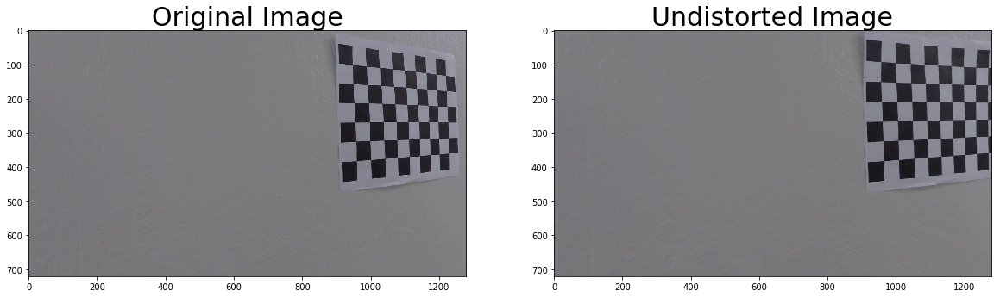

In [46]:
import pickle
%matplotlib inline

# Test undistortion on an image
filepath = test_example_dir + test_img_name
img = cv2.imread(filepath)
img_size = (img.shape[1], img.shape[0])
print(img_size)
print(img.shape[::-2])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open(calib_result_path, "wb" ) )

dst = cv2.undistort(img, mtx, dist, None, mtx)
undist_path = test_example_dir + 'undist_'+ test_img_name
cv2.imwrite(undist_path,dst)


# Visualize undistortion
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

plt.show()

In [47]:
fh = open(calib_result_path, "rb" )
dist_pickle = pickle.load(fh) 
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

In [48]:
def plot_image (img):
    shape = img.shape
    print(shape)
    if (len(shape) < 3):
        plt.imshow(img, cmap = 'gray')
    else:
        plt.imshow(img)
    plt.show()
    
# Plot the result
def plot2imgs (image1, title1, image2, title2):
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    
    if (len(image1.shape) < 3):
        ax1.imshow(image1, cmap='gray')
    else:
        ax1.imshow(image1)
    ax1.set_title(title1, fontsize=50)


    if (len(image2.shape) < 3):
        ax2.imshow(image2, cmap='gray')
    else:
        ax2.imshow(image2)
    ax2.set_title(title2, fontsize=50)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    

(1280, 720)
(3, 720)


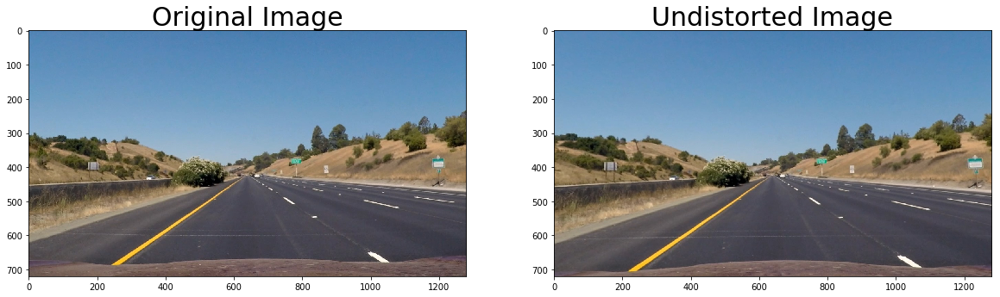

In [49]:
img = cv2.imread('./test_images/straight_lines1.jpg')
img_size = (img.shape[1], img.shape[0])
print(img_size)
print(img.shape[::-2])


dst = cv2.undistort(img, mtx, dist, None, mtx)
undist_path = test_example_dir + 'undist_'+ test_img_name
cv2.imwrite(undist_path,dst)


# Visualize undistortion
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

plt.show()

## Thresholding
This section implements needed thresholding functions.

In [50]:
# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.

def abs_sobel_thresh(img, orient='x', sobel_kernel = 3, thresh = (0, 255)):
    #img input is always in RGB
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  #read from mpimg
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if (orient == 'x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel )        
    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = nksize = sobel_kernel p.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max

    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh [0]) & (scaled_sobel <= thresh [1])] = 1
 
    # 6) Return this mask as your binary_output image
    return sbinary



# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    #input image assumed in RGB format
    
    # Apply the following steps to img
    
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel)
    
    # 3) Calculate the magnitude 
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_magnitude = np.uint8(255*magnitude/np.max(magnitude))
                             
    # 5) Create a binary mask where mag thresholds are met
    sbinary = np.zeros_like(scaled_magnitude)

    sbinary[(scaled_magnitude >= mag_thresh [0]) & (scaled_magnitude <= mag_thresh [1])] = 1
    binary_output = np.copy(sbinary)
                        
    # 6) Return this mask as your binary_output image
    return binary_output


# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # image input is always in RGB format
    
    # Apply the following steps to img

    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)

    # 3) Take the absolute value of the x and y gradients
    abs_sobelx, abs_sobely = np.absolute(sobelx), np.absolute(sobely)
    
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    dir_gradient = np.arctan2(abs_sobely, abs_sobelx)
    #dir_gradient = np.absolute(dir_gradient)
    
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(dir_gradient)
    binary_output[(dir_gradient > thresh[0]) & (dir_gradient < thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
    return binary_output
    
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (1,) * channel_count
    else:
        ignore_mask_color = 1
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = np.multiply(mask, img)  #basically 1 x 1 = 1;   1 x 0 = 0
    
    #print("in region of interest:")
    #print (np.max(masked_image))
    
    return masked_image



In [51]:
#Experiment with different gray thresholds
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

image = cv2.imread("./test_images/test1.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


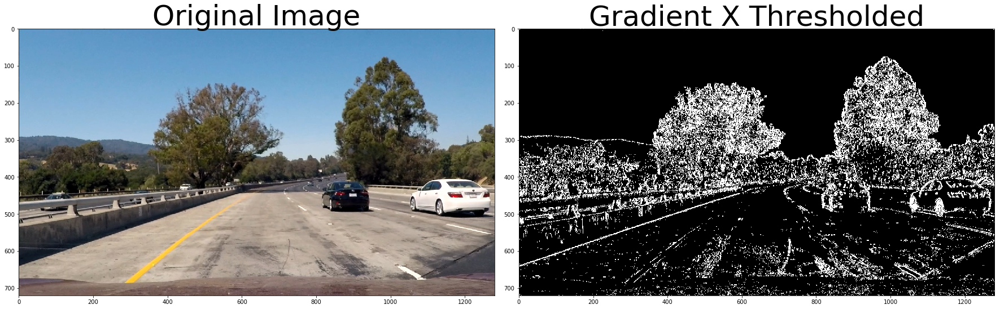

In [52]:
# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(10, 220))

# Plot the result
plot2imgs (image, 'Original Image', gradx, 'Gradient X Thresholded')

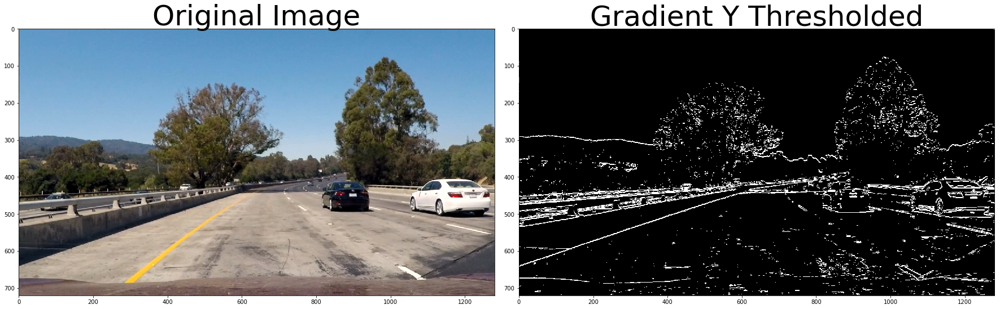

In [53]:
# Apply each of the thresholding functions

grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(30, 150))
# Plot the result
# Plot the result
plot2imgs (image, 'Original Image', grady, 'Gradient Y Thresholded')

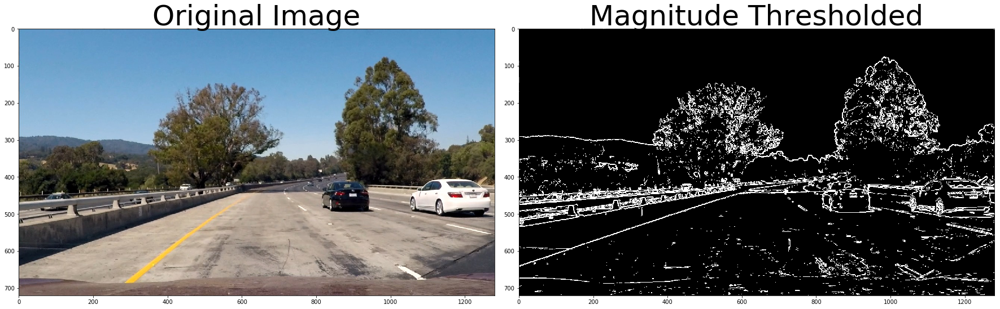

In [54]:
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 150))

# Plot the result
plot2imgs (image, 'Original Image', mag_binary, 'Magnitude Thresholded')

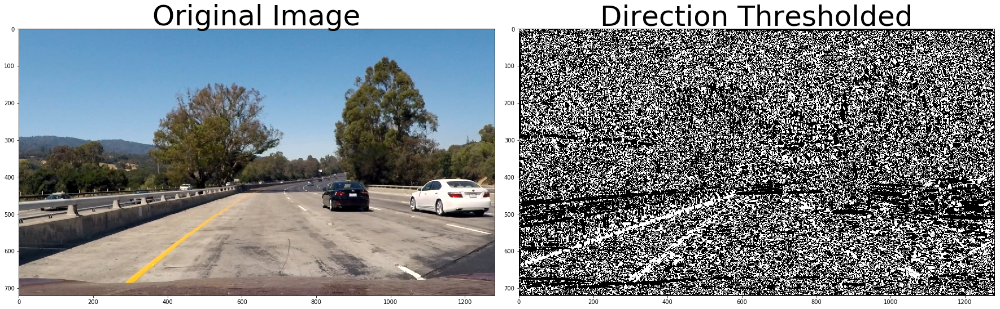

In [55]:

dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))

# Plot the result
plot2imgs (image, 'Original Image', dir_binary, 'Direction Thresholded')

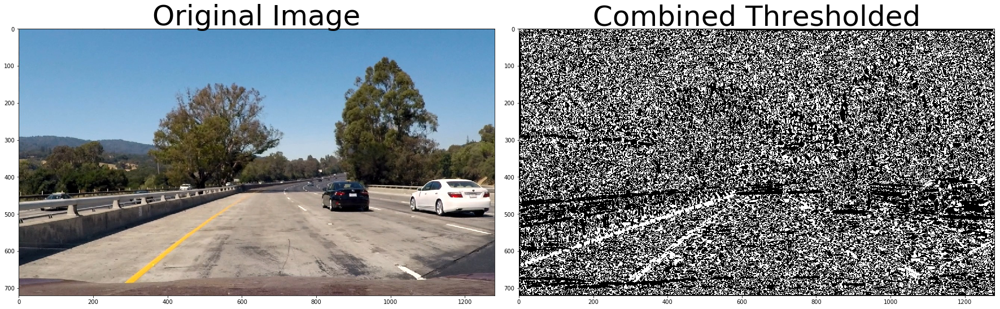

In [56]:

combined = np.zeros_like(dir_binary)
combined[(gradx == 1)  & (dir_binary == 1)] = 1

# Plot the result
plot2imgs (image, 'Original Image', dir_binary, 'Combined Thresholded')

In [57]:
def combo_threshold (image):
    ksize = 3
    clr_thresh = (80, 255)
    dir_thresh = (0.65, 1.35)
    dir_ksize = 15
    
    image_size = (image.shape[1], image.shape[0])
    #get combined threshold
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(10, 250))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(10, 250))
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(10, 250))
    dir_binary = dir_threshold(image, sobel_kernel=dir_ksize, thresh=dir_thresh)
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    
    #Get R & G information
    R = image [:,:,0]
    G = image [:,:,1]
    B = image [:,:,2]
    
    #R & G channels contain Yellow and white line information.
    r_binary = np.zeros_like(R)
    r_binary[(R > clr_thresh[0]) & (R <= clr_thresh[1])] = 1
    
    g_binary = np.zeros_like(G)
    g_binary[(G > clr_thresh[0]) & (G <= clr_thresh[1])] = 1
    
    rg_binary = np.zeros_like (g_binary)
    rg_binary [(r_binary > 0) & (g_binary > 0)] = 1
    
    #Extract HSL color spaces
    hsl = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    H = hsl [:, :, 0]
    S = hsl [:, :, 1]
    L = hsl [:, :, 2]
    
    white_binary = np.zeros_like(S)
    white_binary[(S >= 201) & (S <= 255)] = 1
    
    yellow_binary = np.zeros_like(H)
    yellow_binary [((H >= 14) & (H <= 36)) & ((S >= 29) & (S <= 205)) & ((L >= 113) & (L <= 255))] = 1
    
    
    combo_binary = np.zeros_like(combined)
    combo_binary [ (yellow_binary > 0) | (white_binary > 0) | (combined > 1)] = 1  
    
    #get the bounding box for area of interest
    bottom_lx = 0.14 * image_size [0]
    bottom_ly = 0.98 * image_size [1]
    bottom_rx = 0.94 * image_size [0] 
    bottom_ry = 0.98 * image_size [1]
    
    top_lx    = 0.45 * image_size [0]  
    top_ly    = 0.55 * image_size [1]
    top_rx    = 0.55 * image_size [0]  
    top_ry    = 0.55 * image_size [1]
    
    vertices = np.array([[(bottom_lx, bottom_ly), (top_lx, top_ly), (top_rx, top_ry),(bottom_rx, bottom_ry)]], dtype=np.int32)

    masked_edges = region_of_interest(combo_binary, vertices)
    
    return masked_edges

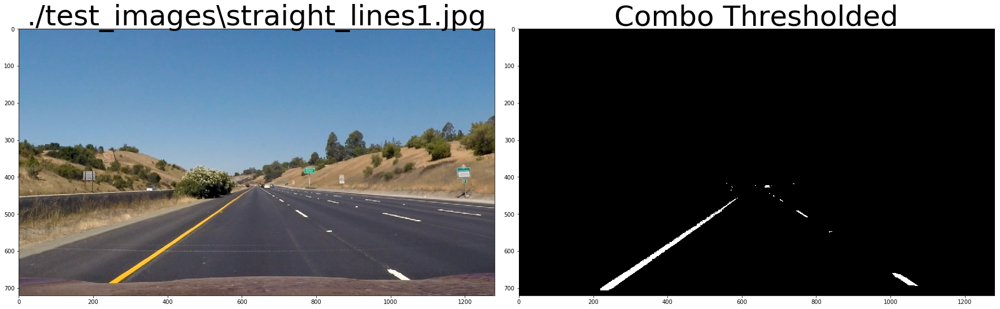

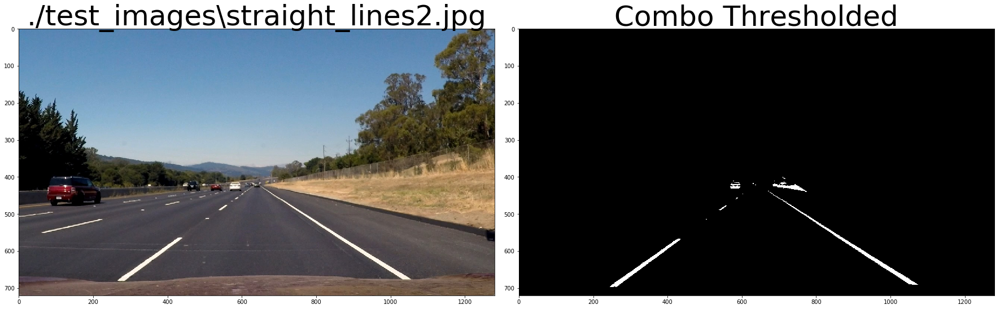

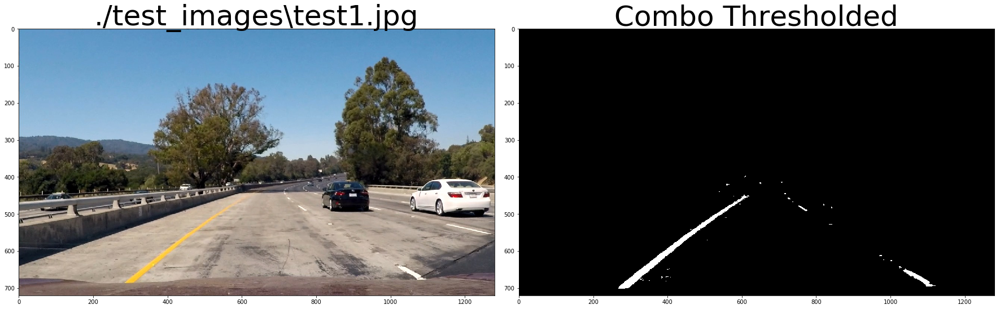

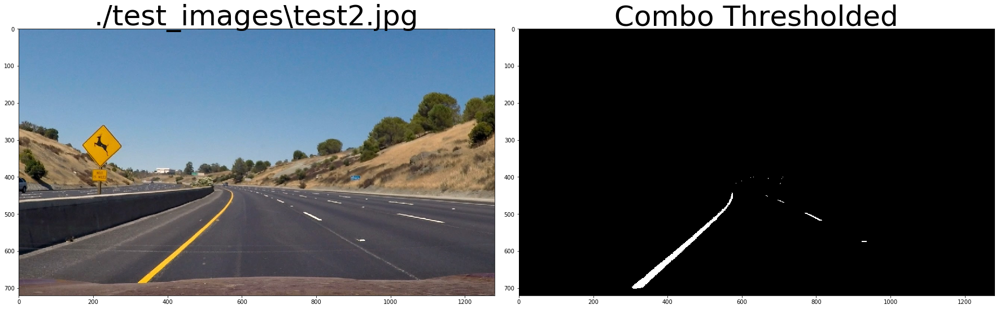

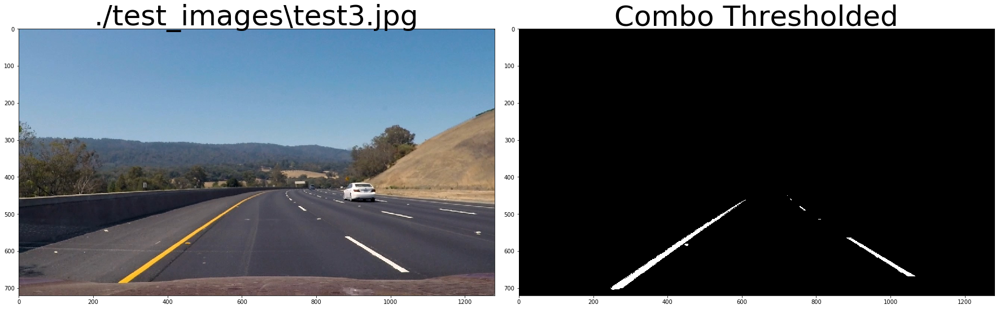

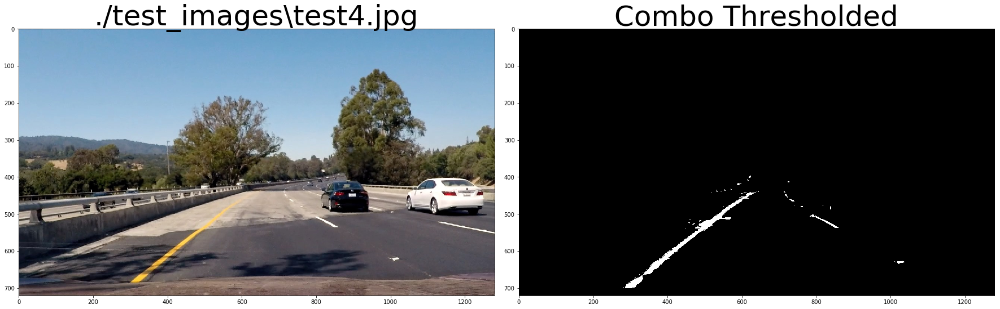

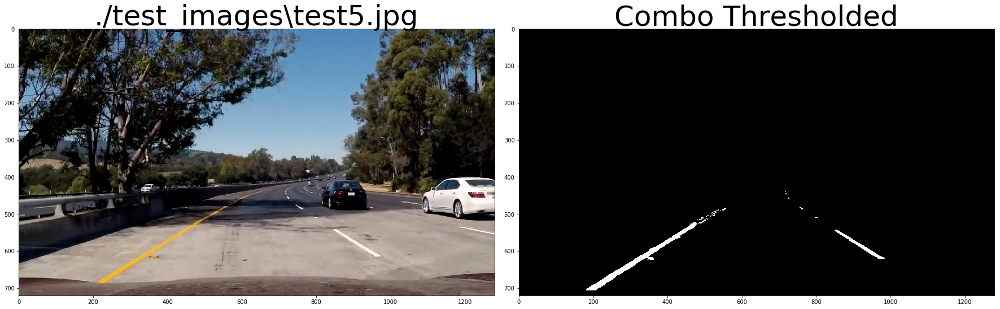

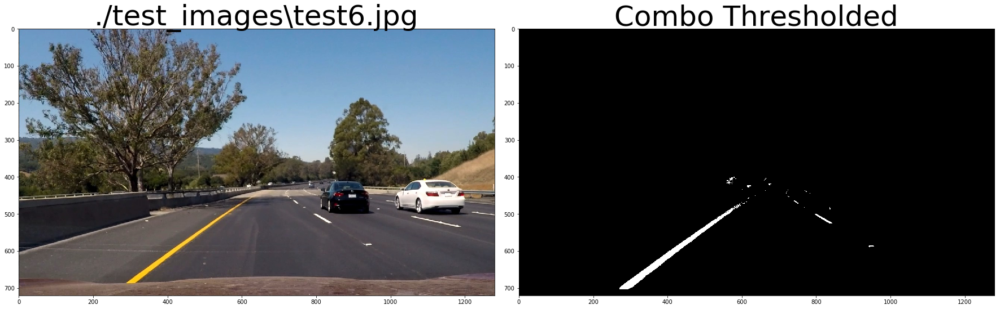

In [58]:
# Make a list of test images
test_images = glob.glob('./test_images/*.jpg')

#for every image do the pipeline processing
for idx, fname in enumerate(test_images):
    
    #read the image
    img = cv2.imread(fname)
    #convert RGB 
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    #undistort the image
    undst = cv2.undistort(img, mtx, dist, None, mtx)
    
    #Apply combo threshold
    combo_binary = combo_threshold (undst)

    # Plot the result
    plot2imgs (img, fname, combo_binary, 'Combo Thresholded')

##  Perspective Transform

1. I computed the camera calibration matrix and distortion coefficient earlier in section, 1.
The following steps are done on test images in this section. 
    2. Apply them to undistort each new frame. 
    3. Apply thresholds to create a binary image
    4. then apply a perspective transform to arrive at warped binary image.

In [59]:
#define do_pxform

def do_pxform (image):
    
    x_offset = 250
    (ny, nx) =image.shape[:2]
    #guidance from 'straight_lines1.jpg' image
    #src = np.float32([[235, 690],[580, 460],[705, 460],[1060, 690]])  #710 is changed to 700
    src = np.float32([[235, 690],[579, 460],[705, 460],[1060, 690]])  #710 is changed to 700

    # position it in the middle of the frame ractagle, i.e.  botton boundaries are
    dst = np.float32([[x_offset, 720],[x_offset, 0],[nx - x_offset, 0],[nx- x_offset, 720]])


    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)

    # Warp an image using the perspective transform, M:
    warped = cv2.warpPerspective(image, M, (nx, ny), flags=cv2.INTER_LINEAR)
    return warped, M, Minv


In [60]:
# Function process the pipeline RGB image input to binary_warped image, perspective matrix and inverse as outputs

def process_pipeline (img):
    #2. undistort the image, as per the calibration matrix
    undst = cv2.undistort(img, mtx, dist, None, mtx)
  

    #3. Apply combo threshold - color gradient and other thesholds
    combo_binary = combo_threshold (undst)

    #4. Do perspective transform on undistorted image
    binary_warped, xform_m, xform_minv = do_pxform(combo_binary)
    return binary_warped, xform_m, xform_minv

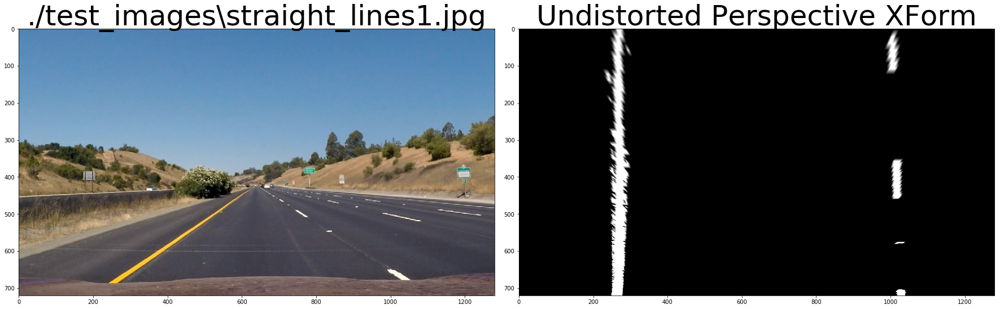

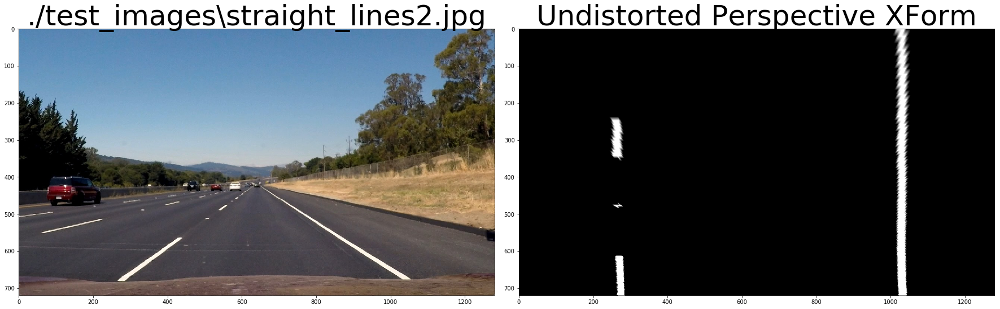

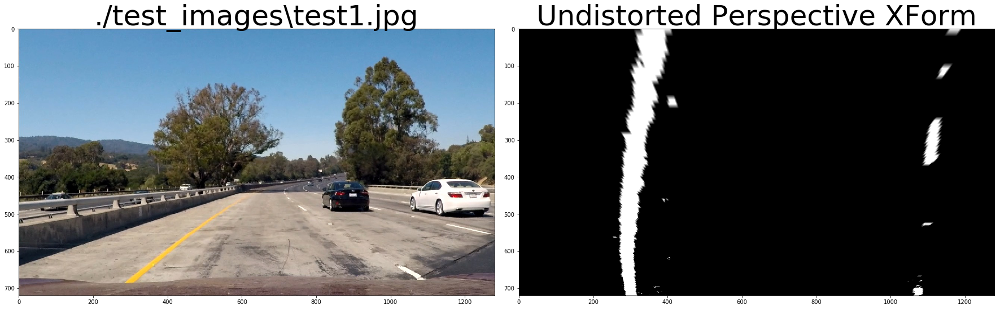

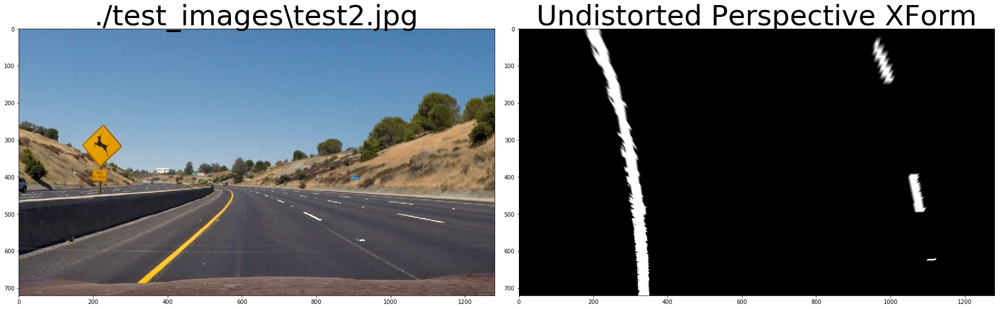

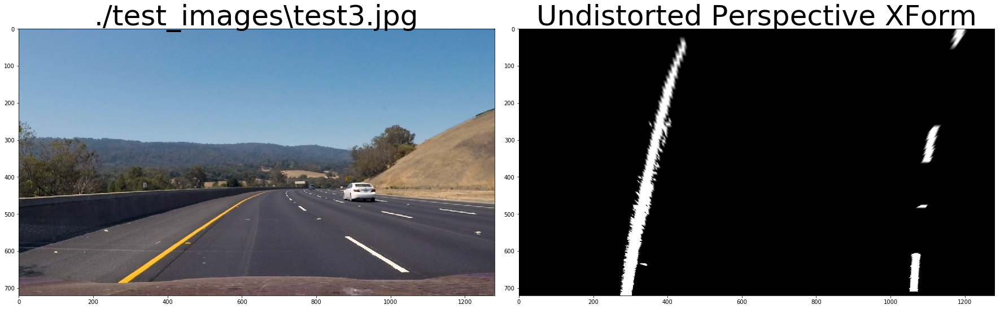

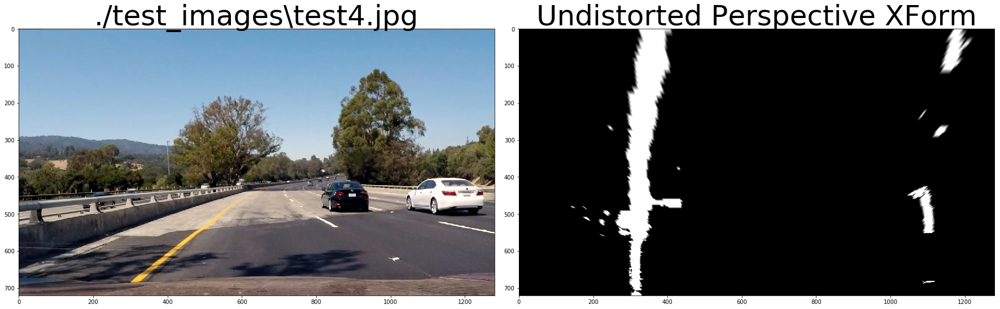

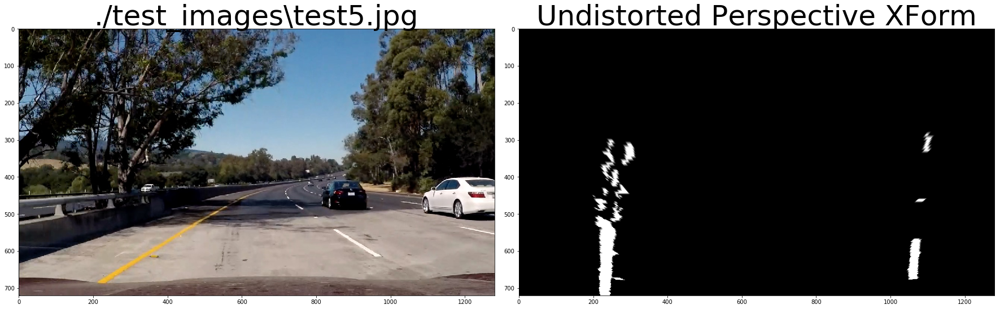

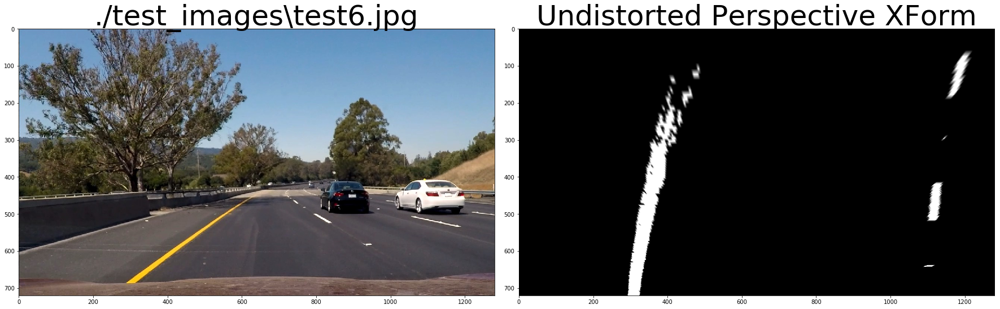

In [61]:

#for every image do the pipeline processing
for idx, fname in enumerate(test_images):
    
    #read the image
    img = cv2.imread(fname)
    #convert RGB 
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    warped_binary, M, Minv = process_pipeline (img)

    # Plot the result
    plot2imgs (img, fname, warped_binary, 'Undistorted Perspective XForm')

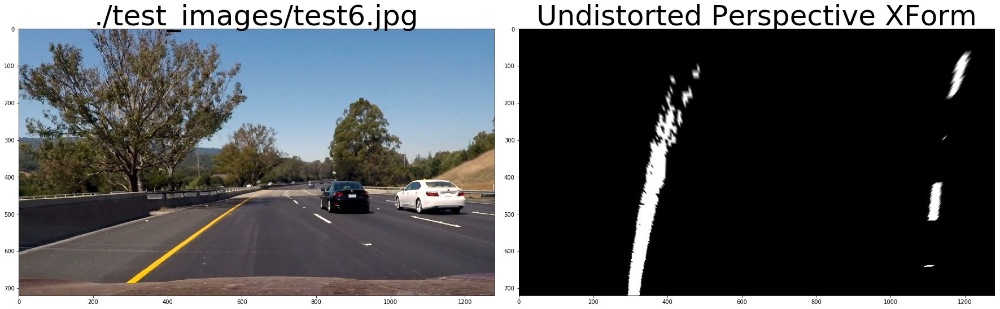

In [62]:
#for every image do the pipeline processing

fname = './test_images/test6.jpg'

#read the image
img = cv2.imread(fname)
    
#convert RGB 
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
binary_warped, M, Minv = process_pipeline (img)

# Plot the result
plot2imgs (img, fname, binary_warped, 'Undistorted Perspective XForm')

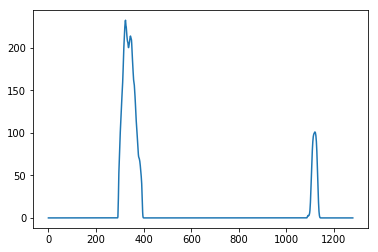

In [63]:
warped = np.copy(binary_warped)
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
plt.plot(histogram)

In [64]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

#Method for polynomial fitting with sliding window.
#Input warped image
def sliding_windows_polyfit (binary_warped):
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

    # Create an output image to draw on and  visualize the result
    img = np.uint8(binary_warped *255)
    out_img = np.dstack((img, img, img))


    
    
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 12 #komer changed from 9 to 12

    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Set the width of the windows +/- margin
    margin = 75 #komer changed from 100 to 75

    # Set minimum number of pixels found to recenter window
    minpix = 38 #komer changed from 50 to 38

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 3)  #komer changed thickness to 3 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 3) #komer changed thickness 3
    
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
    
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit, right_fit = None, None
    if (len(leftx) > 0):
        left_fit = np.polyfit(lefty, leftx, 2)
    if (len(rightx) > 0):
        right_fit = np.polyfit(righty, rightx, 2)
    
    visual_data = (out_img, histogram)
    return left_fit, right_fit, left_lane_inds, right_lane_inds, visual_data

In [65]:
#Method to plot polyfit
# Generate x and y values for plotting
def plot_polyfit (binary_warped, left_fit, right_fit, left_lane_inds, right_lane_inds, visual_data):
    
    (out_img, histo) = visual_data
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, binary_warped.shape[1])
    plt.ylim(binary_warped.shape[0], 0)

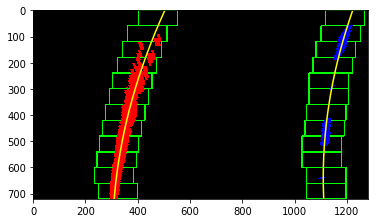

In [66]:
testimg = './test_images/test6.jpg'
#read the image
img = cv2.imread(testimg)
    
#convert RGB 
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
binary_warped, M, Minv = process_pipeline (img)

#poly fit
left_fit, right_fit, left_lane_inds, right_lane_inds, visuals = sliding_windows_polyfit (binary_warped)

# Plot the result
plot_polyfit (binary_warped, left_fit, right_fit, left_lane_inds, right_lane_inds, visuals)

In [67]:
#Function to polyfit using most recent frame fit data

def incremental_polyfit(binary_warped, left_fit_last, right_fit_last):
    
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    margin = 75  #komer changed from 100 to 75
    left_lane_inds = ((nonzerox > (left_fit_last[0]*(nonzeroy**2) + left_fit_last[1]*nonzeroy + 
    left_fit_last[2] - margin)) & (nonzerox < (left_fit_last[0]*(nonzeroy**2) + 
    left_fit_last[1]*nonzeroy + left_fit_last[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit_last[0]*(nonzeroy**2) + right_fit_last[1]*nonzeroy + 
    right_fit_last[2] - margin)) & (nonzerox < (right_fit_last[0]*(nonzeroy**2) + 
    right_fit_last[1]*nonzeroy + right_fit_last[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    #initialize the fit variables
    left_fit, right_fit = None, None
            
    #And you're done! But let's visualize the result here as well
    # Create an output image to draw on and  visualize the result
    img = np.uint8(binary_warped *255)
    out_img = np.dstack((img, img, img))

    # Fit a second order polynomial to each
    if ((len(leftx) > 0) and (len(rightx) > 0)):
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)

        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    
        if (left_fit is not None):
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    
        if (right_fit is not None):
            right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    

        window_img = np.zeros_like(out_img)

        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    else:
        result = out_img

    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    visual_data = (result, histogram)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, visual_data

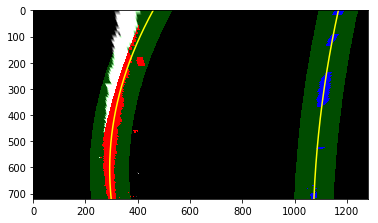

In [68]:
testimg = './test_images/test1.jpg'
#read the image
img = cv2.imread(testimg)
    
#convert RGB 
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
binary_warped, M, Minv = process_pipeline (img)

#poly fit
left_fit_inc, right_fit_inc, left_lane_inds_inc, right_lane_inds_inc, visuals_inc = incremental_polyfit (binary_warped, left_fit, right_fit)

# Plot the result
plot_polyfit (binary_warped, left_fit_inc, right_fit_inc, left_lane_inds_inc, right_lane_inds_inc, visuals_inc)

In [69]:
#Function to compute radius of curvature and the central distance

def compute_radc_centerd (binary_warped, left_fit, right_fit, left_lane_inds, right_lane_inds):
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    left_curverad, right_curverad, central_distance = 0, 0, 0
    
    
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    ploty = np.linspace(0, binary_warped.shape[0]-1,  binary_warped.shape[0])
    y_eval = np.max(ploty)

    
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    
    # Fit new polynomials to x,y in world space
    if (len (leftx) > 0) and (len(rightx) > 0):
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    else:
        print("compute_radc_centerd: len(leftx) - {}, len(rightx)-{}".format(len(leftx), len(rightx)))
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm   ', right_curverad, 'm')
    
    #compute central distance
    if (left_fit is not None) and (right_fit is not None):
        if (len(left_fit) != 3) or (len(right_fit) != 3):
            print("compute_radc_centerd:lens left_fit {}, right_fit {}".format(len(left_fit), len(right_fit)))
        vehicle_place = binary_warped.shape [1] / 2
        height = binary_warped.shape[0] 
        left_fit_intercept = left_fit[0]* (height**2) + left_fit[1] * height + left_fit[2] 
        right_fit_intercept = right_fit[0]* (height**2) + right_fit[1] * height + right_fit[2] 
        lane_center = (left_fit_intercept + right_fit_intercept) / 2
        central_distance = (vehicle_place - lane_center) * xm_per_pix
    
    return left_curverad, right_curverad, central_distance
# Example values: 632.1 m    626.2 m

In [70]:
l_rad, r_rad, center = compute_radc_centerd (binary_warped, left_fit_inc, right_fit_inc, left_lane_inds_inc, right_lane_inds_inc)
print(l_rad, r_rad, center)

364.75943577130704 1335.9654452256746 -0.24409151433665943


In [71]:
#Function to fill the lane.

def paint_lane (img, binary_warped, Minv, left_fit, right_fit, data):
    #img - color RGB image
    #binary_warped - pipeline process output
    #data is curvature and central_distance
    #Minv - Inverse perspective xform matrix.
    #left fit and right fit
    
    if (left_fit is None) or (right_fit is None):
        return img
 
    out_img = np.copy(img)
    (ny, nx) = out_img.shape[:2]
    ploty = np.linspace(0, ny-1, ny)

    blank_img = np.uint8(np.zeros_like(binary_warped))
    color_blank = np.dstack ((blank_img, blank_img, blank_img))
    

    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # do the necessary transposing of data fo plottng
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Fill the lane 
    cv2.fillPoly(color_blank, np.int_([pts]), (0, 255, 0))
    cv2.polylines(color_blank, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_blank, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Unwarp the image using inverse transform
    unwarped = cv2.warpPerspective(color_blank, Minv, (nx, ny)) 
    
    # Superimpose on the original image
    out_img = cv2.addWeighted(out_img, 1, unwarped, 0.5, 0)
    
    #print the data on top left corner
    (radc, central_distance) = data
    
    a_font = cv2.FONT_HERSHEY_SIMPLEX
    a_text = "Radius of Curvature: {} mtrs".format(int(radc))
    cv2.putText(out_img, a_text, (40, 50), a_font, 1.5, (0,255,0), 2, cv2.LINE_AA)
    
    # write distance data
    
    if (central_distance < 0):
        a_text = "Vehicle at {:.2f} mtrs left of the center".format(-central_distance)
    else:
        text = "Vehicle at {:.3f} mtrs right of the center".format(central_distance)
    cv2.putText(out_img, a_text, (40,100), a_font, 1.5, (255,0,0), 2, cv2.LINE_AA)
        
    return out_img

514.0811224242995 3070.2319559854513 -0.02363735069910922


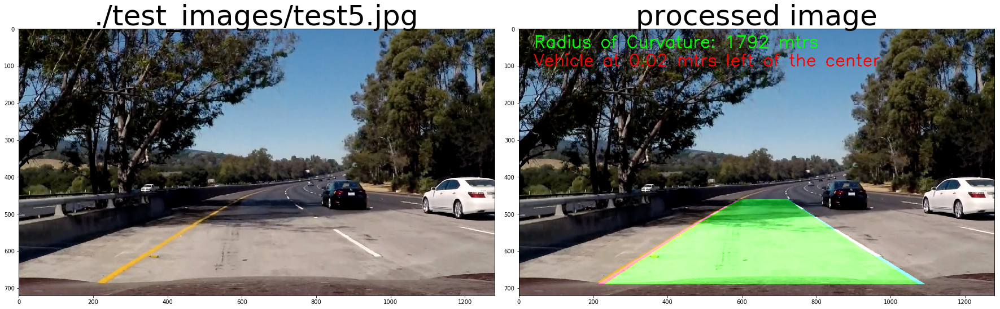

In [72]:
testimg = './test_images/test5.jpg'
#read the image
img = cv2.imread(testimg)
    
#convert RGB 
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
binary_warped, M, Minv = process_pipeline (img)

#poly fit
left_fit, right_fit, left_lane_inds, right_lane_inds, visuals = sliding_windows_polyfit (binary_warped)

l_rad, r_rad, center = compute_radc_centerd (binary_warped, left_fit, right_fit, left_lane_inds, right_lane_inds)
print(l_rad, r_rad, center)

data = ((l_rad + r_rad)/2, center)

# Plot the result
out_img = paint_lane (img, binary_warped, Minv, left_fit, right_fit, data)

# Plot the result
plot2imgs (img, testimg, out_img, 'processed image')

In [73]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
        #limit on the history
        self.history_limit = 9
        
        #most recent pixel count
        self.pixel_count = 0
    def update_fit(self, afit, inds):
        # add a fit to the history and update
        if (afit is not None):
            if (self.best_fit is not None):
                self.diffs = abs(afit - self.best_fit)
                    
            #check for signiticant deviations in the current coefficients and best fit
#            if ((self.diffs[0] > 0.001) or (self.diffs[1] > 1.0) or (self.diffs[2] > 100.)) and len(self.current_fit) > 0:
            if ((self.diffs[0] > 0.001) or (self.diffs[1] > 10.0) or (self.diffs[2] > 1000.)) and len(self.current_fit) > 0:
                self.detected = False
                print("update_fit>", self.diffs, len(self.current_fit))
            else:
                #print("updated_fit<", self.diffs, len(self.current_fit))
                self.detected = True
                self.pixel_count = np.count_nonzero(inds)
                self.current_fit.append(afit)
                
                #manage the history limits
                #print("=", self.diffs, len(self.current_fit))
                if len(self.current_fit) > self.history_limit:
                    self.current_fit.pop(0) # remove the aged fit from history
                self.best_fit = np.average(self.current_fit, axis=0)
                #print("update_fit: len of best_fit {}".format(len(self.best_fit)))
                    
        else: #update the history in case of no new fit found
            self.detected = False
            print("!", self.diffs, len(self.current_fit))
            if len(self.current_fit) > 0:
                self.current_fit.pop(0)  # remove the aged fit from history
                
            #check whether still history is present
            if len(self.current_fit) > 0:
                self.best_fit = np.average(self.current_fit, axis=0)
            else:
                print("update_fit: empty current_fit {}".format(len(self.current_fit)))

In [74]:
frames_missed = 0
intercept_dist = []
aggregate_frames = 0

In [75]:
# This function will color the image
# Input: Original image
# Output: Original image with colored region

def process_image(image):

    #make a local copy of image
    w_img = np.copy(image)
    
    #Apply pipe line of undistort and perspective image and thresholding
    binary_warped, M, Minv = process_pipeline (w_img)
    
    
    if (left_line.detected is False) or (right_line.detected is False):
        #poly fit
        left_fit, right_fit, left_lane_inds, right_lane_inds, visuals = sliding_windows_polyfit (binary_warped)
    else:
        #poly fit
        left_fit, right_fit, left_lane_inds, right_lane_inds, visuals = \
        incremental_polyfit (binary_warped, left_line.best_fit, right_line.best_fit)

    #do sanity checks
    if (left_fit is not None) and (right_fit is not None):
        #find the intercepts
        ny = w_img.shape[0]
        lx_intercept = left_fit[0]*(ny**2) + left_fit[1] * ny + left_fit[2]
        rx_intercept = right_fit[0]*(ny**2) + right_fit[1] * ny + right_fit[2]
        intercept_diff_margin = abs (rx_intercept - lx_intercept)
        intercept_dist.append(intercept_diff_margin)
        if (intercept_diff_margin > 950) or (intercept_diff_margin < 700):  #be lineant a bit
            left_fit = None
            right_fit = None
            print("process_image: lx_intercept {:.3f}, rx_intercept {:.3f},  intercept_diff_margin {:.3f}".format(lx_intercept, rx_intercept, intercept_diff_margin))
            
    #invoke update fit
    left_line.update_fit(left_fit, left_lane_inds)
    right_line.update_fit(right_fit, right_lane_inds)
       
    #compute the radius of curvature and central distance
    if(left_line.best_fit is not None) and (right_line.best_fit is not None):
        #print("process_image: l & r", left_line.best_fit, right_line.best_fit)
        l_rad, r_rad, center = compute_radc_centerd (binary_warped, left_line.best_fit, right_line.best_fit, left_lane_inds, right_lane_inds)
        #print(l_rad, r_rad, center)

        data = ((l_rad + r_rad)/2, center)

        # Plot the result
        out_img = paint_lane (w_img, binary_warped, Minv, left_fit, right_fit, data)
        #print("*")
    else:
        frames_missed += 1
        print("process_image: missed frames {}".format(frames_missed))
        out_img = w_img

    return out_img

In [76]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

left_line = Line()
right_line = Line()

video_out = './project_output_video.mp4'
video_in = VideoFileClip('./project_video.mp4')
processed_video = video_in.fl_image(process_image)
%time processed_video.write_videofile(video_out, audio=False)

[MoviePy] >>>> Building video ./project_output_video.mp4
[MoviePy] Writing video ./project_output_video.mp4


  0%|                                                                                         | 0/1261 [00:00<?, ?it/s]

! [0. 0. 0.] 2
! [0. 0. 0.] 2
compute_radc_centerd: len(leftx) - 0, len(rightx)-0


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [10:52<00:00,  1.80it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_output_video.mp4 

Wall time: 10min 55s


In [72]:
print(frames_missed)

0


In [ ]:
print(len(intercept_dist))
print(min(intercept_dist))
print(max(intercept_dist))

In [ ]:
plt.hist(intercept_dist, 20)
plt.show

In [ ]:
min